# Welcome on Board! 

Hope I will escort you to your favorite alternate dimension! 

Instead of creating a classification model from scratch, we will try one-line explotary data analysis(EDA) tool and AutoML. I believe that this notebook will help you to handle a binary classification problem with the fastest way :) 

Buckle up! we have a binary classification problem for Spaceship Titanic Passengers and our evaluation metric is accuracy as mentioned in the problem summary. Transportation percentage is given as %50 in the training dataset which means we have a balanced dataset. My objective is to use ydata_profiling(Create an EDA report with only one-line code), lazypredictor(build 29 models with only one-line code) and autokeras(streghten your results with the power of 100 Keras models) libraries to make predictions.

We will go through some common steps:<br>
1) [Preparing Libraries and Data](#1)<br>
2) [Explatory Data Analysis(EDA)](#2)<br>
3) [Preprocess the Data](#3)<br>
4) [Fit 29 Models with LazyPredictor](#4)<br>
5) [Fit 100 Models with AutoKeras](#5)<br>
6) [Final Prediction and Export](#6)<br>
7) [AutoKeras Trials with Other Datasets](#7)

I will give brief explanations for each step. If you have any questions, please let me know :)  



# 1) Preparing Libraries and Data

Required libraries are listed and the first five rows of the training dataset are shown below. You may need to install some libraries via pip or conda.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#!pip install -U ydata-profiling #You may need to install the library
#!pip install ipywidgets #You may need to install the library
from ydata_profiling import ProfileReport

from sklearn.model_selection import train_test_split
from sklearn.experimental import enable_iterative_imputer 
from sklearn.impute import SimpleImputer, IterativeImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer

!pip install lazypredict #You may need to install the library
from lazypredict.Supervised import LazyClassifier

!pip install autokeras #You may need to install the library
import autokeras as ak
from tensorflow import keras

import lightgbm as lgbm # for iterative imputer
from lightgbm import LGBMClassifier

/opt/conda/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/opt/conda/lib/python3.10/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.6/148.6 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.7/527.7 kB 23.8 MB/s eta 0:00:00


In [2]:
#get the data
df = pd.read_csv("/kaggle/input/spaceship-titanic/train.csv")
df.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.00,False,0.00,0.00,0.00,0.00,0.00,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.00,False,109.00,9.00,25.00,549.00,44.00,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.00,True,43.00,3576.00,0.00,6715.00,49.00,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.00,False,0.00,1283.00,371.00,3329.00,193.00,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.00,False,303.00,70.00,151.00,565.00,2.00,Willy Santantines,True


### Notes on investigating the data 
Before EDA part, we should check the Dataset Description page of the competition to drive some information about the variables.

2 variables, Cabin and PassengerId, should be parsed before we continue. Cabin variable contains deck, number, and side information and PassengerId can contribute whether a passenger with a group. 


In [3]:
#After reading the competition description

def initial_process(df_):
    df = df_.copy()

    # Parse Cabin variable
    df["deck"] = df["Cabin"].str.split("/",expand=True)[0]
    df["num"] = df["Cabin"].str.split("/",expand=True)[1].astype("float")
    df["side"] = df["Cabin"].str.split("/",expand=True)[2]
    df.drop(["Cabin"],axis=1,inplace=True)
    
    # Parse Name
    df["Surname"] = df["Name"].str.split(expand=True)[1]
    
    # Parse PassengerId variable
    df[["Passenger_group", "PassengerId_no"]] = df["PassengerId"].str.split("_",expand=True)
    df["PassengerId_no"] = df["PassengerId_no"].astype("float64")
    
    # Family Flag
    df["fam_flag"] = df["Surname"] + "_" + df["Passenger_group"]
    
    return df

In [4]:
df_initial = initial_process(df)
df_initial.columns

Index(['PassengerId', 'HomePlanet', 'CryoSleep', 'Destination', 'Age', 'VIP',
       'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck', 'Name',
       'Transported', 'deck', 'num', 'side', 'Surname', 'Passenger_group',
       'PassengerId_no', 'fam_flag'],
      dtype='object')

We can fill some missing values with the help of other variables:

1) Passengers in CryoSleep can not spend in the Spaceship.<br>
2) We can guess family information by looking at surnames and passenger groups then use them to fill missing values. <br>

In [5]:
# Filling Missing values based on the description

def fill_missing(df_):
    df = df_.copy()

    #df_group = df["Passenger_group"].value_counts().to_frame().reset_index().query('Passenger_group > 1').rename(columns={"Passenger_group":"Group_size"})
    #df = pd.merge(df,df_group,how="left",left_on="Passenger_group",right_on="index")
    #df["Group_size"].fillna(1,inplace=True)
    df_fam = df.groupby(["Surname","Passenger_group"]).agg("count")[["PassengerId"]].query('PassengerId > 1').rename(columns={"PassengerId":"Fam_size"})
    df = pd.merge(df,df_fam,how="left",on=["Surname","Passenger_group"])
    df["Fam_size"].fillna(1,inplace=True)
    #df.drop(["index"],axis=1,inplace=True)
    
    # CryoSleep for passengers with spending
    df["CryoSleep"] = df["CryoSleep"].fillna(df.query('RoomService + FoodCourt + ShoppingMall + Spa + VRDeck > 0 & CryoSleep.isnull()')["CryoSleep"].replace({None: False}))
    df.loc[df["CryoSleep"] == True,["RoomService","FoodCourt","ShoppingMall","Spa","VRDeck"]] = df.loc[df["CryoSleep"] == True,["RoomService","FoodCourt","ShoppingMall","Spa","VRDeck"]].fillna(0)
    
    # Fill missing values according to the family information
    df_fam_detail = df.query('HomePlanet.notnull() & Destination.notnull() & deck.notnull() & num.notnull() & side.notnull()') \
    .groupby("fam_flag")["HomePlanet","Destination","deck","num","side"] \
    .apply(lambda x: x.mode().iloc[0]) \
    .rename(columns={"HomePlanet":"HomePlanet_fam_freq", "Destination":"Destination_fam_freq", "deck":"deck_fam_freq", "num":"num_fam_freq", "side":"side_fam_freq"})
    df = pd.merge(df,df_fam_detail,how="left",on="fam_flag")
    df['HomePlanet'] = df['HomePlanet'].fillna(df['HomePlanet_fam_freq'])
    df['Destination'] = df['Destination'].fillna(df['Destination_fam_freq'])
    df['deck'] = df['deck'].fillna(df['deck_fam_freq'])
    df['num'] = df['num'].fillna(df['num_fam_freq'])
    df['side'] = df['side'].fillna(df['side_fam_freq'])
    df.drop(["HomePlanet_fam_freq","Destination_fam_freq","deck_fam_freq","num_fam_freq","side_fam_freq"],axis=1,inplace=True)
    df.drop(["fam_flag","Passenger_group","Surname"],axis=1,inplace=True)
    
    return df

 

In [6]:
df_initial_ = fill_missing(df_initial)
df_initial_.columns

Index(['PassengerId', 'HomePlanet', 'CryoSleep', 'Destination', 'Age', 'VIP',
       'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck', 'Name',
       'Transported', 'deck', 'num', 'side', 'PassengerId_no', 'Fam_size'],
      dtype='object')

# 2) Exploratory Data Analysis (EDA)

In this step, we will create an EDA report to discover some trends and facts about the variables. Our aim is **to reduce the number of variables without losing information about the target** by looking at their missing percentage and effectiveness on the target (for example "PassengerId" variable may not be related to the target.) 

pandas-profiling libray will help us to:
- Overview the training dataset by investigating the shape, numerical&categorical variables, missing values, etc, 
- Perform univariate analysis to show the distributions of variables
- Perform bivariate and multivariate analysis to show the correlations.
- Raise alerts for some variables under some conditions like high correlation, imbalance etc.

We will try to answer some questions like which age group is more likely to spend money for RoomService, whether we have outliers in Age or which variables are more related to the target.

ProfileReport will support us a comprehensive report and you can investigate and draw some conclusions about the variables by using the tabs: Overview, Variables, Interactions, Correlations, Missing Values, and Sample. You should also check the Alerts Section which is really helpful for the preprocessing step.

For more open source EDA tools, you can check this blog: https://medium.com/@odsc/11-open-source-data-exploration-tools-you-need-to-know-in-2023-f66d212ee077 


In [7]:
profile = ProfileReport(df, title="Pandas Profiling Report")

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Some comments:**
 - HomePlanet and deck (derived from PassengerID) are highly correlated (corr coeff:0.75). We can drop one of them or let the model handle.
 - VRDeck and FoodCourt are also highly correlated (corr coeff:0.51). We will let the model handle.
 - Some variables like Name, PassengerID, num do not support any information for the classification problem. Therefore, we should drop it.
 - Many variables contain missing values. We will impute them by using fill_missing function, simple, and iterative imputers in the following sections.
 - RoomService, FoodCourt, ShoppingMall, Spa, and VRDeck contain some outlier values. However, we will let the model handle.


In [8]:
# Data process after EDA report
def preprocess(df_, istrain=True):
    df = df_.copy()
    df[["CryoSleep","VIP"]] = df[["CryoSleep","VIP"]].astype("float64")
    
    if istrain:
        # missing value handling for some variables
        df.dropna(subset=["Transported","Name","PassengerId"],inplace=True)
        # Dropping some variables
        df.drop(["PassengerId","Name"],axis=1,inplace=True)
    else:
        df.drop(["Name"],axis=1,inplace=True)
    
    return df


In [9]:
df_initial2 = preprocess(df_initial_)
df_initial2.columns

Index(['HomePlanet', 'CryoSleep', 'Destination', 'Age', 'VIP', 'RoomService',
       'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck', 'Transported', 'deck',
       'num', 'side', 'PassengerId_no', 'Fam_size'],
      dtype='object')

Lets have a one last look at the EDA report after quick changes on the dataset.

In [10]:
profile_eda = ProfileReport(df_initial2, title="Pandas Profiling Report After Initial Process")
profile_eda.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Some comments:**
 - Our new columns like Fam_size, PassengerId_no etc have some correlation problem (some of them are expected).
 - After our fill_missing operation based on the variable descriptions, we have still missing values. For the sake of simplicity, we can impute most frequent values for categorical variables and median values for numerical variables. However, since CryoSleep has the highest correlation (0.47) with the target, it will be imputed with a iterative imputer.


# 3) Preprocess the Data

We had an initial preprocessing at the beginning by considering the competition description. Now lets prepare the data for ML algorithms. In this step, we will create 2 different column transformers which the first one is for AutoKeras and the latter is for LazyPredict. Since the dataset requirements of LazyPredictor and AutoKeras are different, our strategy is here:

 * **Missing Values:** The most frequent class(mode) for categorical variables and median values for numerical variables will be used. However, since CyroSleep is a powerful variable, we will use IterativeImputer with LGBMClassifier estimator. LGBM is chosen because its accuracy from Lazypredictor is high (in following section) and scaling is not needed for tree-based algorithms. Handling missing values is not necessary for AutoML tools like AutoKeras, but I got higher scores with this simple imputation operation. Therefore, it will be implemented for both.
 * **One Hot Encoding(OHE):** Since categorical variables can not be directly used in many models, we will use one hot encoding for nominal variables. This operation will be implemented for both. (it is also needed for iterative imputer) 
 * **Scaling:** It is not necessary for tree-based models, however it is a recommended step for many models. Therefore, the Logarithmic transformation will be used only for LazyPredictor. 

In summary, we will perform missing values, OHE, and scaling steps for LazyPredictor, while  missing values and OHE steps for AutoKeras.

In [11]:
# Train Test Datasets
X = df_initial2.drop("Transported", axis=1)
y = df_initial2["Transported"]

Xtrain, Xval, ytrain, yval = train_test_split(X, y, test_size = 0.20)
print(f'Xtrain shape: {Xtrain.shape}, ytrain shape: {ytrain.shape}')
print(f'Xval shape: {Xval.shape}, yval shape: {yval.shape}')

Xtrain shape: (6794, 15), ytrain shape: (6794,)
Xval shape: (1699, 15), yval shape: (1699,)


In [12]:
# indices of categorical variables
categorical_var = Xtrain.select_dtypes(include="object").columns.to_list()
cat_index_list = Xtrain.columns.to_frame(index=False,name="variables").query('variables in @categorical_var').index.to_list()

# pipeline for categorical variables
cat_pipe = Pipeline([('most_frequent_impute', SimpleImputer(strategy="most_frequent")),
                     ('ohe', OneHotEncoder(handle_unknown="ignore", sparse=False))])

ct_automl = ColumnTransformer([("cat_pipe",cat_pipe,cat_index_list),
                               ("median_impute",SimpleImputer(strategy="median"),[3, 4, 5, 6, 7, 8, 9, 11, 13, 14])], 
                              remainder="passthrough") 
# iterative imputer
imputer = IterativeImputer(estimator=LGBMClassifier(n_estimators=100, objective="binary"), max_iter=2, tol=1e-2)
# pipeline for automl
automl_pipe = Pipeline([('ct_automl', ct_automl),
                        ('iterative_impute', imputer)])

Xtrain_automl = automl_pipe.fit_transform(Xtrain)
Xval_automl = automl_pipe.transform(Xval)

print(f'Xtrain_automl shape: {Xtrain_automl.shape}, Xval_automl shape: {Xval_automl.shape}')

Xtrain_automl shape: (6794, 27), Xval_automl shape: (1699, 27)


In [13]:
# Logarithmic transformation for Lazypredictor
log_scaling = FunctionTransformer(np.log1p, validate=True)
Xtrain_lazy = log_scaling.fit_transform(Xtrain_automl)
Xval_lazy = log_scaling.transform(Xval_automl)

print(f'Xtrain_lazy shape: {Xtrain_lazy.shape}, Xval_lazy shape: {Xval_lazy .shape}')

Xtrain_lazy shape: (6794, 27), Xval_lazy shape: (1699, 27)


# 4) Fit 29 Models with LazyPredictor

LazyPredictor is a Python library that simplifies the process of building machine learning models by automating several steps involved in model selection and evaluation. By using LazyPredictor, you can save time and effort in the initial stages of model development, as it automatically generates a summary report that includes the performance metrics of each model on your dataset. This allows you to get a high-level understanding of how different algorithms perform on your data and helps you make informed decisions on which models to explore further. For further information: https://lazypredict.readthedocs.io/en/latest/

With a few lines of code, we will have fit 29 models on our dataset and get baseline accuracy scores.

In [14]:
clf_lazy = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf_lazy.fit(Xtrain_lazy, Xval_lazy, ytrain, yval)
models

100%|██████████| 29/29 [00:23<00:00,  1.25it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LGBMClassifier,0.81,0.81,0.81,0.81,0.74
RandomForestClassifier,0.80,0.80,0.80,0.80,1.26
XGBClassifier,0.79,0.79,0.79,0.79,1.51
SVC,0.79,0.79,0.79,0.79,2.24
NuSVC,0.79,0.79,0.79,0.79,2.99
AdaBoostClassifier,0.79,0.79,0.79,0.79,0.50
ExtraTreesClassifier,0.78,0.78,0.78,0.78,1.07
BaggingClassifier,0.78,0.78,0.78,0.78,0.39
LinearSVC,0.78,0.78,0.78,0.78,1.05


LazyPredictor suggests LGBM and XGB models for the problem with around 81% accuracy. Lets try with AutoKeras.

# 5) Fit 100 Models with AutoKeras

AutoKeras is an open-source library for automated machine learning (AutoML) in Python. It is designed to simplify the process of building and deploying machine learning models by automating the model selection, hyperparameter tuning, and architecture search.

The main advantage of AutoKeras is its ease of use. It provides a high-level API that abstracts away many of the complexities involved in traditional machine learning workflows. With just a few lines of code, you can specify the type of problem you want to solve (classification, regression, etc.) and let AutoKeras handle the rest.

AutoKeras automatically preprocesses the data, searches for the optimal model architecture, and tunes hyperparameters such as learning rate, number of layers, and number of neurons. It also supports advanced features like ensembling multiple models and neural architecture search with transfer learning. For further information: https://autokeras.com

First, as a trial we will fit 3 models with StructuredDataClassifier from AutoKeras and observe loss and accuracy scores for each epoch, so lets see how it works!

While it is running, you will see the hyperparameters (like optimizer, learning rate, dropout layers etc.) of each model. It also supports validation loss and validation accuracy scores at each epoch.

In [15]:
clf_autokeras = ak.StructuredDataClassifier(overwrite=True, max_trials=3)

clf_autokeras_history = clf_autokeras.fit(Xtrain_automl,ytrain,validation_data=(Xval_automl,yval),
                           epochs=20) 

yval_hat = clf_autokeras.predict(Xval_automl)

Trial 3 Complete [00h 00m 37s]
val_accuracy: 0.7839905619621277

Best val_accuracy So Far: 0.8022366166114807
Total elapsed time: 00h 01m 50s
Epoch 1/20
213/213 [==============================] - 2s 5ms/step - loss: 0.5589 - accuracy: 0.7134 - val_loss: 0.4629 - val_accuracy: 0.7681
Epoch 2/20
213/213 [==============================] - 1s 4ms/step - loss: 0.4335 - accuracy: 0.7936 - val_loss: 0.4297 - val_accuracy: 0.7940
Epoch 3/20
213/213 [==============================] - 1s 4ms/step - loss: 0.4112 - accuracy: 0.8054 - val_loss: 0.4221 - val_accuracy: 0.7934
Epoch 4/20
213/213 [==============================] - 1s 4ms/step - loss: 0.4017 - accuracy: 0.8100 - val_loss: 0.4191 - val_accuracy: 0.7928
Epoch 5/20
213/213 [==============================] - 1s 4ms/step - loss: 0.3956 - accuracy: 0.8098 - val_loss: 0.4172 - val_accuracy: 0.7922
Epoch 6/20
213/213 [==============================] - 1s 4ms/step - loss: 0.3906 - accuracy: 0.8122 - val_loss: 0.4158 - val_accuracy: 0.7905
Epoch 

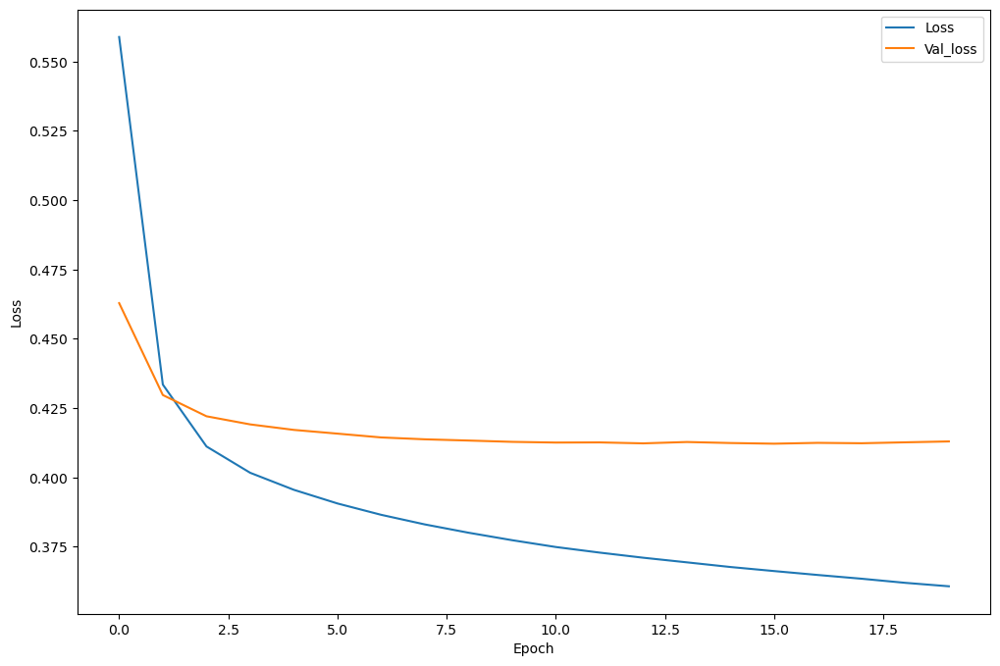

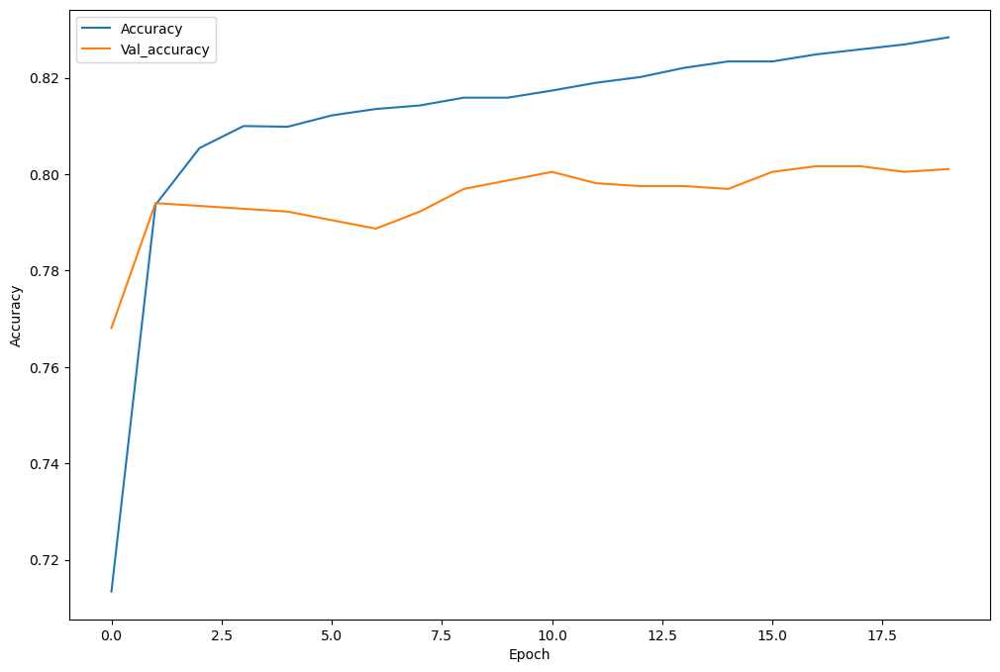

In [16]:
# For loss function
plt.figure(figsize=(12,8))
plt.plot(clf_autokeras_history.history['loss'], label="Loss")
plt.plot(clf_autokeras_history.history['val_loss'], label="Val_loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

# For Accuracy metric
plt.figure(figsize=(12,8))
plt.plot(clf_autokeras_history.history['accuracy'], label="Accuracy")
plt.plot(clf_autokeras_history.history['val_accuracy'], label="Val_accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


**Comments:**
- At each epoch, we see training loss and training accuracy improve while the validation values do not. After a certain epoch, the validation scores do not change much and the model should stop running for model performance issues and risks like overfitting.
- Our best validation accuracy is obtained around 81%, similarly LGBM model from LazyPredictor.
- In fit function, we can use EarlyStopping from keras.callbacks to prevent overfitting and improve model generalization.

At the next code block, I used EarlyStopping but fit function returns nothing and I could not run .predict function. It also does not return .history function. If you have any suggestion or comment, please let me know :)


Well, we used AutoKeras with only 3 trials/models. Now, lets increase max_trials to 50. (100 models take some time)

In [17]:
# max_trials increased! and early stopping 
clf_autokeras_all = ak.StructuredDataClassifier(overwrite=True, max_trials=100)

#early_stopping = keras.callbacks.EarlyStopping(monitor = "val_loss", patience = 3,
#                                              restore_best_weights = True) # restore is important. It will support the best ones instead of the last ones

clf_autokeras_all_history = clf_autokeras_all.fit(Xtrain_automl,ytrain,
                                                  validation_data=(Xval_automl,yval),
                                                  epochs=25, verbose=0) #callbacks=[early_stopping],

print(f'The best validation accuracy: {max(clf_autokeras_all_history.history["val_accuracy"])}')

The best validation accuracy: 0.8087109923362732


# 6) Final Prediction and Export

In [18]:
df_test = pd.read_csv("/kaggle/input/spaceship-titanic/test.csv")
df_initial_test = initial_process(df_test)
df_initial_transport = df_initial.drop("Transported",axis=1)
df_initial_all = pd.concat([df_initial_test, df_initial_transport])
df_all_fill_miss = fill_missing(df_initial_all)
df_initial2_all = preprocess(df_all_fill_miss,istrain=False)

test_id_list = list(df_test["PassengerId"])
df_initial2_test = df_initial2_all.query("PassengerId.isin(@test_id_list)")

df_tmp = df_initial2_test[["PassengerId"]]
df_initial2_test.drop("PassengerId",axis=1,inplace=True)

# prediction for test
Xtest_automl = ct_automl.transform(df_initial2_test) 
ytest_hat = clf_autokeras_all.predict(Xtest_automl) 

df_final = df_tmp.merge(pd.DataFrame(ytest_hat.astype("bool")), left_index=True, right_index=True)
df_final.rename(columns={0:"Transported"}).set_index("PassengerId").to_csv("submission.csv")

134/134 [==============================] - 0s 3ms/step


# 7) AutoKeras Trials with other datasets

We implemented AutoKeras on our preprocessed dataset. Lets try it with the dataset which has missing values (without preprocessing) and the dataset which is prepared for LazyPredictor. Then see the results.

In [19]:
# dataset is not preprocessed!
clf_autokeras2 = ak.StructuredDataClassifier(overwrite=True, max_trials=3)
clf_autokeras2_history = clf_autokeras2.fit(Xtrain,ytrain,validation_data=(Xval,yval),epochs=10, verbose=0)
print(f'The best validation accuracy: {max(clf_autokeras2_history.history["val_accuracy"])}')

The best validation accuracy: 0.7916421294212341


In [20]:
# dataset is fully preprocessed! (LazyPredictor preprocessing)
clf_autokeras3 = ak.StructuredDataClassifier(overwrite=True, max_trials=3)
clf_autokeras3_history = clf_autokeras3.fit(Xtrain_lazy,ytrain,validation_data=(Xval_lazy,yval),epochs=10,verbose=0)
print(f'The best validation accuracy: {max(clf_autokeras3_history.history["val_accuracy"])}')

The best validation accuracy: 0.7775161862373352


**Comment:** the dataset without preprocessing generally performed better than the other, so I think AutoKeras's preprocessing works well!

If you found this notebook helpful, some upvotes would be very much appreciated! :) 



You can also check my other notebooks for classification and regression prediction from scratch in Kaggle.
- Classification - Titanic Survival Prediction with XGB: https://www.kaggle.com/code/egeerkmen/titanic-survival-prediction-with-xgb
- Regression - CatBoost and XGB with detailed EDA: https://www.kaggle.com/code/egeerkmen/catboost-and-xgb-with-detailed-eda